# **Video Games Sales Analysis**

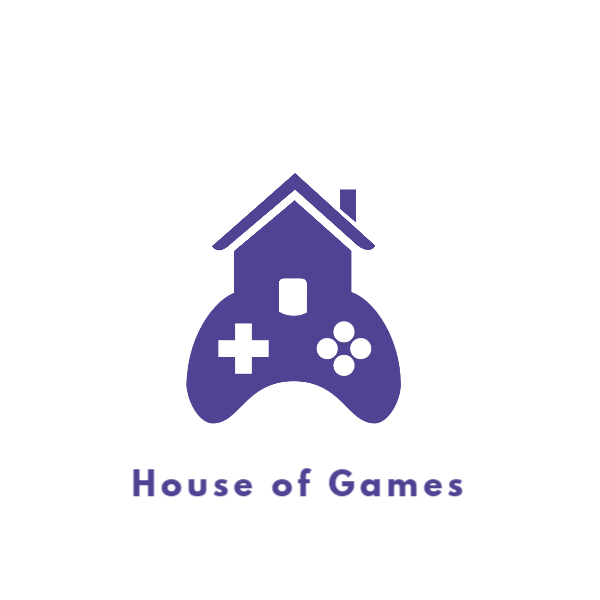

## Table of Contents
- [Introduction](#1)
- [What does the business need?](#2)
- [Challenges](#3)
- [Approach / Methodology](#4)

## Introduction  <a id="1"></a>
I'm sure we all loved playing video games, especially during our childhood days. Getting lost in the world of Fifa, Need for Speed, Call of duty all day was my favorite childhood pastime.
<br>Working for a video game company would a dream come true for any gaming fanatic. 
<br>So Let's relive our childhood dream & combine it with my passion for analytics. Data set used was downloaded from __[Kaggle.](https://www.kaggle.com/datasets/gregorut/videogamesales)__




## What does the business need? <a id="2"></a>
Let' pretend that we're a sales analyst fora major video retailer "House of Games" & have been given the task to provide suggestions & insights that would help make bsuiness decisions to improve profitability or provide cost saving. Let's explore the dataset & see if we can find some interesting insights 

### We are looking for answers to the below questions / hypothesis
- Question 1 Which region has performed the best in terms of sales? **- NA, EU, JP, others.**
- Question 2 How does the sales trend look like? **- Completed.**
- Question 3 Best selling genre by Overall Sales & Regional Sales **- Completed.**
- Question 3 Best Selling platform by Overall Sales & Regional Sales **- Completed.**
- Question 4 Best selling Console Type by Regional Sales & Overall Sales **- Completed.** 
- Question 5 Create a dashboard in Tableau
- Trend for genres (how long does the genre stay on top) **- Completed.**
- Lifepsan of a console (Top Plaform for every year along with the release date) **- Completed.**
- Top publisher by Revenue each year **- Completed.**
- Relationship of Video Games according to Year, Platform, Genre  and Overall Sales

Hypothesis
- Are handheld consoles a dying breed (check the number of sales made each year for both types using side by side bar chart)
- Action games are more popular
- Sony is the best selling manufacturer


### Challenges <a id="3"></a>
#### [Data Cleansing](#3.1)
- Most of the columns were mostly clean with very minimal missing value.<be>Columns (Critic_Score, Critic_Count, User_Score, User_Count, Rating) had around 50 % missing valus & could not be used.
<br>I have opted to remove the rows with missing values (Year_of_Release 8 missing values, Publisher 1 missing value) rather than fill the values with the column average( mean), or with the most(mode) ocurring value. as the missing values were very few & had minimal impact on the dataset. Columns (Critic_Score, Critic_Count, User_Score, User_Count, Rating) were removed as well since they were not being used to answer our questions. 
- There was no information for the console manufacturer & console type.
    <br>Console type & manufacturer details was extracted from Wikipedia & appended as new columns into the dataset.

### Approach / Methodology <a id="4"></a>
- **[EDA (Exploratory Data Analysis)](#4.1)**
 

In [6]:
# importing the required libraries
import pandas as pd
import numpy as np
import matplotlib as mp
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import plotly.express as px
import plotly.io as pio
pio.renderers
pio.renderers.default = "notebook_connected"
from plotly.offline import init_notebook_mode,iplot
init_notebook_mode(connected=True)


from plotly.subplots import make_subplots #import new library
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")
print("The modules are imported")

import plotly.graph_objs as go
from plotly.tools import FigureFactory as ff
import matplotlib.pyplot as plt

The modules are imported


----

In [7]:
# We will first import the dataset which is in CSV format.
df = pd.read_csv('Video_Game_Sales_as_of_Jan_2017.csv')
print("success")

success


In [8]:
# Let's look at the top 5 rows
df.head(5)                                                                                                                                                                                       

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Rating
0,Wii Sports,Wii,2006.0,Sports,Nintendo,41.36,28.96,3.77,8.45,82.54,76.0,51.0,8.0,324.0,E
1,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,NaN,NaN,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.68,12.80,3.79,3.29,35.57,82.0,73.0,8.3,712.0,E
3,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.61,10.95,3.28,2.95,32.78,80.0,73.0,8.0,193.0,E
4,Pokemon Red/Pokemon Blue,G,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,NaN,NaN,NaN,NaN,NaN


**The datset contains 15 columns. Their names and definition are as follows:**

    Name - The games name

    Platform - Platform of the games release (i.e. PC,PS4, etc.)

    - Year - Year of the game's release

    - Genre - Genre of the game

    - Publisher - Publisher of the game

    - NA_Sales - Sales in North America (in millions)

    - EU_Sales - Sales in Europe (in millions)

    - JP_Sales - Sales in Japan (in millions)

    - Other_Sales - Sales in the rest of the world (in millions)

    - Global_Sales - Total worldwide sales

    - Critic_Score - Score given by Critics

    - Critic_Count - Number of Critics who scored the game

    - User_Score - Score given by Critics

    - User_Count - Number of Users who scored the game

    - Rating - Video Game Rating (i.e PG, E etc.)

----

In [9]:
# The info method in python will give us some useful information on the dataset such as the number of range index, m -columns, column labels, datatypes, non-null values in each column etc.
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17416 entries, 0 to 17415
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             17416 non-null  object 
 1   Platform         17416 non-null  object 
 2   Year_of_Release  17408 non-null  float64
 3   Genre            17416 non-null  object 
 4   Publisher        17415 non-null  object 
 5   NA_Sales         17416 non-null  float64
 6   EU_Sales         17416 non-null  float64
 7   JP_Sales         17416 non-null  float64
 8   Other_Sales      17416 non-null  float64
 9   Global_Sales     17416 non-null  float64
 10  Critic_Score     8336 non-null   float64
 11  Critic_Count     8336 non-null   float64
 12  User_Score       7798 non-null   float64
 13  User_Count       7798 non-null   float64
 14  Rating           10252 non-null  object 
dtypes: float64(10), object(5)
memory usage: 2.0+ MB


--------

#### Data Cleansing <a id="3.1"></a>


- Handling Missing Values

In [10]:
print("Missing values are")
df.isna().sum()

Missing values are


Name                  0
Platform              0
Year_of_Release       8
Genre                 0
Publisher             1
NA_Sales              0
EU_Sales              0
JP_Sales              0
Other_Sales           0
Global_Sales          0
Critic_Score       9080
Critic_Count       9080
User_Score         9618
User_Count         9618
Rating             7164
dtype: int64

Columns User_Score, User_Count, Critic_Score, Critic_Count, Rating have almost 50 % of data missing.
<br> Let's drop these columns first then we can deal with other columns with less missing value.

In [11]:
print("Before we drop the columns, we have 17416 rows & 15 columns")
df.shape

Before we drop the columns, we have 17416 rows & 15 columns


(17416, 15)

----

In [12]:
# Let's create a copy of the actual dataset. In case we make an immutable error, we can go back to the original data set.
df_modified = df.copy()
print ("success")

success


-----

In [13]:
columns_to_drop = ['User_Score', 'User_Count', 'Critic_Score', 'Critic_Count', 'Rating']
print ("success")
# creating a list of columns to drop & assigning it to a variable

success


-------

In [14]:
df.head()

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Rating
0,Wii Sports,Wii,2006.0,Sports,Nintendo,41.36,28.96,3.77,8.45,82.54,76.0,51.0,8.0,324.0,E
1,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,NaN,NaN,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.68,12.80,3.79,3.29,35.57,82.0,73.0,8.3,712.0,E
3,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.61,10.95,3.28,2.95,32.78,80.0,73.0,8.0,193.0,E
4,Pokemon Red/Pokemon Blue,G,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,NaN,NaN,NaN,NaN,NaN


------

In [15]:
# Dropping or deleting the columns that are not required
df_modified.drop(columns=columns_to_drop, inplace=True)
print("success")

success


-------

In [16]:
# The 5 columns with Nan Values has been sucessfully dropped. We now have 10 columns.
df_modified

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,Wii Sports,Wii,2006.0,Sports,Nintendo,41.36,28.96,3.77,8.45,82.54
1,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
2,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.68,12.80,3.79,3.29,35.57
3,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.61,10.95,3.28,2.95,32.78
4,Pokemon Red/Pokemon Blue,G,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37
...,...,...,...,...,...,...,...,...,...,...
17411,Nancy Drew: The Deadly Secret of Olde World Park,DS,2007.0,Adventure,Majesco Entertainment,0.00,0.00,0.00,0.00,0.01
17412,Fashion Designer: Style Icon,DS,2007.0,Simulation,505 Games,0.00,0.00,0.00,0.00,0.01
17413,Ashita no Joe 2: The Anime Super Remix,PS2,2002.0,Fighting,Capcom,0.00,0.00,0.01,0.00,0.01
17414,NadePro!! Kisama no Seiyuu Yatte Miro!,PS2,2009.0,Adventure,GungHo,0.00,0.00,0.01,0.00,0.01


------

In [17]:
# let's deal with the missing values for columns Year_of_Release & Publisher.
df_modified.isnull().sum().reset_index().rename(columns={'index':'Columns',0:'Count'}).sort_values(by=['Count'], ascending=False)

,Columns,Count
2,Year_of_Release,8
4,Publisher,1
0,Name,0
1,Platform,0
3,Genre,0
5,NA_Sales,0
6,EU_Sales,0
7,JP_Sales,0
8,Other_Sales,0
9,Global_Sales,0


--------

In [18]:
# Since we have 9 missing values in total combined, we can drop the rows with these entries as it will not have a major impact.
df_modified.dropna(subset = ['Year_of_Release', 'Publisher'], axis=0, inplace=True)
print("success")

success


----

- Adding New Columns For Console Type & Manufacturer.

In [19]:
# Let's insert a column that gives us the console type.
df_modified['Console_Type'] = df_modified['Platform'].map({'DS' : 'Handheld', 'PS2' : 'Home', 'PS3' : 'Home', 'Wii' : 'Home', 'PSP' : 'Handheld', 'X360' : 'Home', 'PS' : 'Home', 'PC' : 'Home', 'GBA': 'Handheld', 'X' : 'Home', 'GC' : 'Home', '3DS' : 'Handheld', 'PSV' : 'Handheld', 'PS4' : 'Home', 'N64': 'Home', 'XOne' : 'Home', 'SNES' : 'Home', 'SAT': 'Home', 'WiiU' : 'Home', '2600' : 'Home', 'NES' : 'Home', 'DC' : 'Home', 'NG' : 'Home', 'WS' : 'Handheld', 'SCD' : 'Home', '3DO' : 'Home', 'TG16' : 'Home', 'GG' : 'Handheld', 'PCFX' : 'Home', 'GEN' : 'Home', 'G' : 'Handheld'})
print("success")

success


-----

In [20]:
# Let's insert another column that gives us the manufacturer name.
df_modified['Console_Manufacturer'] = df_modified['Platform'].map({'DS' : 'Nintendo', 'PS2' : 'Sony', 'PS3' : 'Sony', 'Wii' : 'Nintendo', 'PSP' : 'Sony', 'X360' : 'Microsoft', 'PS' : 'Sony', 'PC' : 'PC', 'GBA': 'Nintendo', 'X' : 'Microsoft', 'GC' : 'Nintendo', '3DS' : 'Nintendo', 'PSV' : 'Sony', 'PS4' : 'Sony', 'N64': 'Nintendo', 'XOne' : 'Microsoft', 'SNES' : 'Nintendo', 'SAT': 'Sega', 'WiiU' : 'Nintendo', '2600' : 'Atari', 'NES' : 'Nintendo', 'DC' : 'Sega', 'NG' : 'SNK', 'WS' : 'Bandai', 'SCD' : 'Sega', '3DO' : 'Panasonic', 'TG16' : 'NEC', 'GG' : 'Sega', 'PCFX' : 'NEC',  'GEN' : 'Sega', 'G' : 'Nintendo'})
print("success")

success


---

In [21]:
# Let's look at the dataset again for any missing values.
df_modified.isnull().sum().reset_index().rename(columns={'index':'Columns',0:'Count'}).sort_values(by=['Count'], ascending=False)

,Columns,Count
0,Name,0
1,Platform,0
2,Year_of_Release,0
3,Genre,0
4,Publisher,0
5,NA_Sales,0
6,EU_Sales,0
7,JP_Sales,0
8,Other_Sales,0
9,Global_Sales,0


------

In [22]:
df_modified.head()

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Console_Type,Console_Manufacturer
0,Wii Sports,Wii,2006.0,Sports,Nintendo,41.36,28.96,3.77,8.45,82.54,Home,Nintendo
1,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,Home,Nintendo
2,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.68,12.80,3.79,3.29,35.57,Home,Nintendo
3,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.61,10.95,3.28,2.95,32.78,Home,Nintendo
4,Pokemon Red/Pokemon Blue,G,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,Handheld,Nintendo


------

In [23]:
print("We now have 17408 rows & 12 columns.")
df_modified.shape

We now have 17408 rows & 12 columns.


(17408, 12)

-----

### Exploratory Data Analysis <a id="4.1"></a>

- Statistical Information

In [24]:
# Let's use the describe method to get some statistical information.
df_modified.describe(include='all')

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Console_Type,Console_Manufacturer
count,17408,17408,17408.000000,17408,17408,17408.000000,17408.000000,17408.000000,17408.000000,17408.000000,17408,17408
unique,12073,31,NaN,12,627,NaN,NaN,NaN,NaN,NaN,2,10
top,Need for Speed: Most Wanted,DS,NaN,Action,Electronic Arts,NaN,NaN,NaN,NaN,NaN,Home,Sony
freq,12,2249,NaN,3500,1380,NaN,NaN,NaN,NaN,NaN,11852,6996
mean,NaN,NaN,2006.630859,NaN,NaN,0.254651,0.140791,0.075044,0.045929,0.516695,NaN,NaN
std,NaN,NaN,5.901598,NaN,NaN,0.800838,0.497446,0.303480,0.183972,1.526439,NaN,NaN
min,NaN,NaN,1976.000000,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.010000,NaN,NaN
25%,NaN,NaN,2003.000000,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.050000,NaN,NaN
50%,NaN,NaN,2008.000000,NaN,NaN,0.070000,0.020000,0.000000,0.010000,0.160000,NaN,NaN
75%,NaN,NaN,2011.000000,NaN,NaN,0.230000,0.100000,0.030000,0.030000,0.450000,NaN,NaN


**Findings**
1. We have around 12073 unique game titles (Name) where "Need for Speed: Most Wanted" is the most occuring title & has appeared 12 times in the dataset.
2. "DS" is the most occuring platform appearing 2249 times.
3. Action is the most sought after Genre. 
4. Electronic Arts has published the most amount of games in this dataset.
5. 25% of NA_Sales, 25% of EU_Sales, Other_Sales 50% of JP_Sales Column has the value 0.000000.
6. Global_Sales has the highest value recorded for sales which is 82.540000.
7. There 2 console types where the type "Home" occurs the most.
8. Sony is the top Console_Manufacturer.

--------

Which region has performed the best in terms of sales?

In [25]:
# Let's find out the total sales for each region

Total_NA_Sales = round((df_modified['NA_Sales'].sum()*1000000), 2)
Total_EU_Sales= round((df_modified['EU_Sales'].sum()*1000000), 2)
Total_JP_Sales= round((df_modified['JP_Sales'].sum()*1000000), 2)
Total_Other_Sales= round((df_modified['Other_Sales'].sum()*1000000), 2)

print("Total Sales made in North America Region is $", Total_NA_Sales)
print("Total Sales made in Europe Region is $", Total_EU_Sales)
print("Total Sales made in Japan Region is $", Total_JP_Sales)
print("Total Sales made in Other Region is $", Total_Other_Sales)

Total Sales made in North America Region is $ 4432970000.0
Total Sales made in Europe Region is $ 2450890000.0
Total Sales made in Japan Region is $ 1306360000.0
Total Sales made in Other Region is $ 799540000.0


**Findings**
- North America Sales tops the list of average sales by area followed by Europe & Japan.

In [26]:
# Let's see how much does each region contributes to the overall sales.

NA_Sales = print ("North America Sales contributes to", round(4432970000/8989760000.0*100, 2),"% of overall sales")
EU_Sales = print ("Europe Sales contributes to", round(2450890000/8989760000.0*100, 2), "% of overall sales")
JP_Sales = print ("Japan Sales contributes to", round(1306360000.0/8989760000.0*100, 2), "% of overall sales")
Other_Sales = print("Other Sales contributes to", round(799540000.0/8989760000.0*100, 2), "% of overall sales")


North America Sales contributes to 49.31 % of overall sales
Europe Sales contributes to 27.26 % of overall sales
Japan Sales contributes to 14.53 % of overall sales
Other Sales contributes to 8.89 % of overall sales


In [27]:
colors = ['grey'] * 4
colors[1]='grey'
colors[2]='grey'
colors[3]='grey'
colors[0] = 'steelblue'

bar1 = go.Figure(data=[go.Bar(
    y=[ 'NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales'],
    x=[49.31, 27.26, 14.53, 8.89],
    orientation='h',
    marker_color=colors)])
bar1.update_layout(title_text='Overall Sales Breakdown by Region')
bar1.update_xaxes(title='Sales Pecentage')
bar1.update_yaxes(title='Regions')

------

Let's see how does the sales trend look for each region by year.

In [28]:
#Grouping the north america sales based on each platform
Yearly_NA_sales = pd.DataFrame(df_modified.groupby("Year_of_Release")[["NA_Sales"]].count().sort_values(by=["Year_of_Release"],ascending=[True]).reset_index())
Yearly_NA_sales.rename(columns = {'Year_of_Release':'Year_NA'}, inplace = True)

#Grouping the europe sales based on each platform
Yearly_EU_sales = pd.DataFrame(df_modified.groupby("Year_of_Release")[["EU_Sales"]].count().sort_values(by=["Year_of_Release"],ascending=[True]).reset_index())
Yearly_EU_sales.rename(columns = {'Year_of_Release':'Year_EU'}, inplace = True)

#Grouping the japan sales based on each platform
Yearly_JP_sales = pd.DataFrame(df_modified.groupby("Year_of_Release")[["JP_Sales"]].count().sort_values(by=["Year_of_Release"],ascending=[True]).reset_index())
Yearly_JP_sales.rename(columns = {'Year_of_Release':'Year_JP'}, inplace = True)

#Grouping the other region sales based on each platform
Yearly_OT_sales = pd.DataFrame(df_modified.groupby("Year_of_Release")[["Other_Sales"]].count().sort_values(by=["Year_of_Release"],ascending=[True]).reset_index())
Yearly_OT_sales.rename(columns = {'Year_of_Release':'Year_OT'}, inplace = True)

#Grouping the global sales based on each platform
Yearly_Global_sales = pd.DataFrame(df_modified.groupby("Year_of_Release")[["Global_Sales"]].count().sort_values(by=['Year_of_Release'],ascending=[True]).reset_index())
Yearly_Global_sales.rename(columns = {'Year_of_Release':'Year_GL'}, inplace = True)

#Concatenating our datasets
Yearly_data=pd.concat([Yearly_NA_sales,Yearly_EU_sales,Yearly_JP_sales,Yearly_OT_sales,Yearly_Global_sales],axis=1).reset_index(drop=True)
Yearly_data.head(3)

,Year_NA,NA_Sales,Year_EU,EU_Sales,Year_JP,JP_Sales,Year_OT,Other_Sales,Year_GL,Global_Sales
0,1976.0,1,1976.0,1,1976.0,1,1976.0,1,1976.0,1
1,1977.0,3,1977.0,3,1977.0,3,1977.0,3,1977.0,3
2,1978.0,4,1978.0,4,1978.0,4,1978.0,4,1978.0,4


In [45]:
subplot1 = make_subplots(rows=5, cols=1, shared_yaxes=True,subplot_titles=("North America Sales","Europe Sales","Japan Sales", "Other region Sales", "Global Sales"))

#Subplot for North America
subplot1.add_trace(go.Line(x=Yearly_NA_sales['Year_NA'], y=Yearly_NA_sales['NA_Sales'],
                    marker=dict(color=[15,15,15,15,15],coloraxis="coloraxis")),1, 1)

#Subplot for Europe
subplot1.add_trace(go.Line(x=Yearly_EU_sales['Year_EU'], y=Yearly_EU_sales['EU_Sales'],
                    marker=dict(color=[15,15,15,15,15], coloraxis="coloraxis")),2, 1)
                   
#Subplot for Japan
subplot1.add_trace(go.Line(x=Yearly_JP_sales['Year_JP'], y=Yearly_JP_sales['JP_Sales'],
                    marker=dict(color=[15,15,15,15,15], coloraxis="coloraxis")),3, 1)

#Subplot for Other Regions
subplot1.add_trace(go.Line(x=Yearly_OT_sales['Year_OT'], y=Yearly_OT_sales['Other_Sales'],
                    marker=dict(color=[15,15,15,15,15], coloraxis="coloraxis")),4, 1)

##Subplot for Global
subplot1.add_trace(go.Line(x=Yearly_Global_sales['Year_GL'], y=Yearly_Global_sales['Global_Sales'],
                    marker=dict(color=[15,15,15,15,15], coloraxis="coloraxis")),5, 1)
                   
subplot1.update_layout(height=1000,width=1000,coloraxis=dict(colorscale='PuBu_r'), showlegend=False)
subplot1.show()

**Findings**
  - The sales revenue goes up from 2000 onwards & starts declining from 2011 onwards for most of the regions & this trend seems to be continuing.
  - Could the reason behind this be due to consumers resorting to the new era of digital devices such as  smartphones, tablets that compete for attention in the gaming market or is it the gaming technology getting outdated & not upto the standard. More details can be viewed on this __[article.](https://www.statista.com/chart/915/consumer-spending-on-video-games-in-the-united-states/)__ on Statista 

   

     

-----

Best selling plaform by Overall Sales & Region Sales


In [47]:
#Grouping the north america sales based on each platform
Platform_na = pd.DataFrame(df_modified.groupby("Platform")[["NA_Sales"]].sum().sort_values(by=['NA_Sales'],ascending=[False]).reset_index())
Platform_na.rename(columns = {'Platform':'Platform_NA'}, inplace = True)

#Grouping the europe sales based on each platform
Platform_eu = pd.DataFrame(df_modified.groupby("Platform")[["EU_Sales"]].sum().sort_values(by=['EU_Sales'],ascending=[False]).reset_index())
Platform_eu.rename(columns = {'Platform':'Platform_EU'}, inplace = True)

#Grouping the japan sales based on each platform
Platform_jp = pd.DataFrame(df_modified.groupby("Platform")[["JP_Sales"]].sum().sort_values(by=['JP_Sales'],ascending=[False]).reset_index())
Platform_jp.rename(columns = {'Platform':'Platform_JP'}, inplace = True)

#Grouping the other region sales based on each platform
Platform_ot = pd.DataFrame(df_modified.groupby("Platform")[["Other_Sales"]].sum().sort_values(by=['Other_Sales'],ascending=[False]).reset_index())
Platform_ot.rename(columns = {'Platform':'Platform_OT'}, inplace = True)

#Grouping the global sales based on each platform
Platform_gs = pd.DataFrame(df_modified.groupby("Platform")[["Global_Sales"]].sum().sort_values(by=['Global_Sales'],ascending=[False]).reset_index())
Platform_gs.rename(columns = {'Platform':'Platform_GL'}, inplace = True)

#Concatenating our datasets
Platform_data=pd.concat([Platform_na,Platform_eu,Platform_jp,Platform_gs,Platform_ot],axis=1).reset_index(drop=True)
Platform_data.head(3)

,Platform_NA,NA_Sales,Platform_EU,EU_Sales,Platform_JP,JP_Sales,Platform_GL,Global_Sales,Platform_OT,Other_Sales
0,X360,604.51,PS2,339.29,DS,176.11,PS2,1256.09,PS2,193.44
1,PS2,583.84,PS3,331.66,PS,139.83,X360,975.43,PS3,136.27
2,Wii,497.74,X360,272.00,PS2,139.62,PS3,943.29,X360,86.05


In [48]:


subplot1 = make_subplots(rows=5, cols=1, shared_yaxes=True,subplot_titles=("North America top platforms","Europe top platforms","Japan top platforms", "Other regions top platforms", "Global top platforms"))

#Subplot for North America
subplot1.add_trace(go.Bar(x=Platform_data['Platform_NA'], y=Platform_data['NA_Sales'],
                    marker=dict(color=[15,15,15,15,15],coloraxis="coloraxis")),1, 1)

#Subplot for Europe
subplot1.add_trace(go.Bar(x=Platform_data['Platform_EU'], y=Platform_data['EU_Sales'],
                    marker=dict(color=[15,15,15,15,15], coloraxis="coloraxis")),2, 1)
                   
#Subplot for Japan
subplot1.add_trace(go.Bar(x=Platform_data['Platform_JP'], y=Platform_data['JP_Sales'],
                    marker=dict(color=[15,15,15,15,15], coloraxis="coloraxis")),3, 1)

#Subplot for Other Regions
subplot1.add_trace(go.Bar(x=Platform_data['Platform_OT'], y=Platform_data['Other_Sales'],
                    marker=dict(color=[15,15,15,15,15], coloraxis="coloraxis")),4, 1)

##Subplot for Global
subplot1.add_trace(go.Bar(x=Platform_data['Platform_GL'], y=Platform_data['Global_Sales'],
                    marker=dict(color=[15,15,15,15,15], coloraxis="coloraxis")),5, 1)
                   
subplot1.update_layout(height=1000,width=1000,coloraxis=dict(colorscale='PuBu_r'), showlegend=False)
subplot1.show()

**Findings**
- Top five best selling platform for each region are :

**North America**
   1. X360
   2. PS2
   3. Wii
   4. PS3
   5. DS
   
**Europe**
   1. PS2
   2. PS3
   3. X360
   4. Wii
   5. PS
   
**Japan**
   1. DS
   2. PS
   3. PS2
   4. SNES
   5. 3DS
 
**Other Regions**
   1. PS2
   2. X360
   3. PS3
   4. Wii
   5. DS
   
      
**Global**
   1. PS2
   2. PS3
   3. x360
   4. Wii
   5. DS
     

------

Best Selling Genre by Overall Sales & Regional Sales

In [32]:
#Grouping the north america sales based on each platform
Genre_na = pd.DataFrame(df_modified.groupby("Genre")[["NA_Sales"]].sum().sort_values(by=['NA_Sales'],ascending=[False]).reset_index())
Genre_na.rename(columns = {'Genre':'Genre_NA'}, inplace = True)

#Grouping the europe sales based on each platform
Genre_eu = pd.DataFrame(df_modified.groupby("Genre")[["EU_Sales"]].sum().sort_values(by=['EU_Sales'],ascending=[False]).reset_index())
Genre_eu.rename(columns = {'Genre':'Genre_EU'}, inplace = True)

#Grouping the japan sales based on each platform
Genre_jp = pd.DataFrame(df_modified.groupby("Genre")[["JP_Sales"]].sum().sort_values(by=['JP_Sales'],ascending=[False]).reset_index())
Genre_jp.rename(columns = {'Genre':'Genre_JP'}, inplace = True)

#Grouping the other region sales based on each platform
Genre_ot = pd.DataFrame(df_modified.groupby("Genre")[["Other_Sales"]].sum().sort_values(by=['Other_Sales'],ascending=[False]).reset_index())
Genre_ot.rename(columns = {'Genre':'Genre_OT'}, inplace = True)

#Grouping the global sales based on each platform
Genre_gs = pd.DataFrame(df_modified.groupby("Genre")[["Global_Sales"]].sum().sort_values(by=['Global_Sales'],ascending=[False]).reset_index())
Genre_gs.rename(columns = {'Genre':'Genre_GL'}, inplace = True)

#Concatenating our datasets
Genre_data=pd.concat([Genre_na,Genre_eu,Genre_jp,Genre_ot,Genre_gs],axis=1).reset_index(drop=True)
Genre_data.head(3)

,Genre_NA,NA_Sales,Genre_EU,EU_Sales,Genre_JP,JP_Sales,Genre_OT,Other_Sales,Genre_GL,Global_Sales
0,Action,885.32,Action,525.31,Role-Playing,358.02,Action,186.56,Action,1761.89
1,Sports,688.60,Sports,380.16,Action,163.57,Sports,135.70,Sports,1340.99
2,Shooter,600.01,Shooter,321.82,Sports,135.80,Shooter,106.03,Shooter,1067.28


In [33]:
subplot1 = make_subplots(rows=5, cols=1, shared_yaxes=True,subplot_titles=("North American top Genres","Europe top Genres","Japan top Genres", "Other regions top Genres", "Global top Genres"))

#Subplot for North America
subplot1.add_trace(go.Bar(x=Genre_data['Genre_NA'], y=Genre_data['NA_Sales'],
                    marker=dict(color=[15,15,15,15,15],coloraxis="coloraxis")),1, 1)

#Subplot for Europe
subplot1.add_trace(go.Bar(x=Genre_data['Genre_EU'], y=Genre_data['EU_Sales'],
                    marker=dict(color=[15,15,15,15,15], coloraxis="coloraxis")),2, 1)
                   
#Subplot for Japan
subplot1.add_trace(go.Bar(x=Genre_data['Genre_JP'], y=Genre_data['JP_Sales'],
                    marker=dict(color=[15,15,15,15,15], coloraxis="coloraxis")),3, 1)

#Subplot for Other Regions
subplot1.add_trace(go.Bar(x=Genre_data['Genre_OT'], y=Genre_data['Other_Sales'],
                    marker=dict(color=[15,15,15,15,15], coloraxis="coloraxis")),4, 1)

##Subplot for Global
subplot1.add_trace(go.Bar(x=Genre_data['Genre_GL'], y=Genre_data['Global_Sales'],
                    marker=dict(color=[15,15,15,15,15], coloraxis="coloraxis")),5, 1)
                   
subplot1.update_layout(height=1000,width=1000,coloraxis=dict(colorscale='PuBu_r'), showlegend=False)
subplot1.show()

**Findings**
- Top five best selling genres for each region are :

**North America**
   1. Action
   2. Sports
   3. Shooter
   4. Platform
   5. Misc
   
**Europe**
   1. Action
   2. Sports
   3. Shooter
   4. Racing
   5. Misc
   
**Japan**
   1. Role Playing
   2. Action
   3. Sports
   4. Platform
   5. Misc
 
**Other Regions**
   1. Action
   2. Sports
   3. Shooter
   4. Racing
   5. Misc
   
      
**Global**
   1. Action
   2. Sports
   3. Shooter
   4. Role playing
   5. Platform
     

----


Best selling Console_Type by Region Sales & Overall Sales

In [34]:
#Grouping the north america sales based on each console manufacturer
cm_na = pd.DataFrame(df_modified.groupby("Console_Manufacturer")[["NA_Sales"]].sum().sort_values(by=['NA_Sales'],ascending=[False]).reset_index())
cm_na.rename(columns = {'Console_Manufacturer':'CM_NA'}, inplace = True)

#Grouping the europe sales based on each platform
cm_eu = pd.DataFrame(df_modified.groupby("Console_Manufacturer")[["EU_Sales"]].sum().sort_values(by=['EU_Sales'],ascending=[False]).reset_index())
cm_eu.rename(columns = {'Console_Manufacturer':'CM_EU'}, inplace = True)

#Grouping the japan sales based on each platform
cm_jp = pd.DataFrame(df_modified.groupby("Console_Manufacturer")[["JP_Sales"]].sum().sort_values(by=['JP_Sales'],ascending=[False]).reset_index())
cm_jp.rename(columns = {'Console_Manufacturer':'CM_JP'}, inplace = True)

#Grouping the other region sales based on each platform
cm_ot = pd.DataFrame(df_modified.groupby("Console_Manufacturer")[["Other_Sales"]].sum().sort_values(by=['Other_Sales'],ascending=[False]).reset_index())
cm_ot.rename(columns = {'Console_Manufacturer':'CM_OT'}, inplace = True)

#Grouping the global sales based on each platform
cm_gs = pd.DataFrame(df_modified.groupby("Console_Manufacturer")[["Global_Sales"]].sum().sort_values(by=['Global_Sales'],ascending=[False]).reset_index())
cm_gs.rename(columns = {'Console_Manufacturer':'CM_GL'}, inplace = True)

#Concatenating our datasets
cm_data=pd.concat([cm_na ,cm_eu,cm_jp,cm_ot,cm_gs],axis=1).reset_index(drop=True)
cm_data.head(3)

,CM_NA,NA_Sales,CM_EU,EU_Sales,CM_JP,JP_Sales,CM_OT,Other_Sales,CM_GL,Global_Sales
0,Nintendo,1769.56,Sony,1116.51,Nintendo,765.58,Sony,471.51,Sony,3623.57
1,Sony,1556.55,Nintendo,787.68,Sony,479.14,Nintendo,192.78,Nintendo,3518.43
2,Microsoft,894.26,Microsoft,387.65,Sega,43.98,Microsoft,110.40,Microsoft,1407.60


In [49]:
subplot1 = make_subplots(rows=5, cols=1, shared_yaxes=True,subplot_titles=("North America top Console","Europe top Console","Japan top Console", "Other regions top Console", "Global top Console"))

#Subplot for North America
subplot1.add_trace(go.Bar(x=cm_data['CM_NA'], y=cm_data['NA_Sales'],
                    marker=dict(color=[15,15,15],coloraxis="coloraxis")),1, 1)

#Subplot for Europe
subplot1.add_trace(go.Bar(x=cm_data['CM_EU'], y=cm_data['EU_Sales'],
                    marker=dict(color=[15,15,15], coloraxis="coloraxis")),2, 1)
                   
#Subplot for Japan
subplot1.add_trace(go.Bar(x=cm_data['CM_JP'], y=cm_data['JP_Sales'],
                    marker=dict(color=[15,15,15], coloraxis="coloraxis")),3, 1)

#Subplot for Other Regions
subplot1.add_trace(go.Bar(x=cm_data['CM_OT'], y=cm_data['Other_Sales'],
                    marker=dict(color=[15,15,15], coloraxis="coloraxis")),4, 1)

##Subplot for Global
subplot1.add_trace(go.Bar(x=cm_data['CM_GL'], y=cm_data['Global_Sales'],
                    marker=dict(color=[15,15,15], coloraxis="coloraxis")),5, 1)
                   
subplot1.update_layout(height=1000,width=1000,coloraxis=dict(colorscale='PuBu_r'), showlegend=False)
subplot1.show()

-----

Trend for genres (how long does the genre stay on top)

In [36]:
df_gen =df_modified[["Year_of_Release", "Genre", "Global_Sales"]]
sum_genre = df_gen.groupby(["Genre", "Year_of_Release"])["Global_Sales"].sum().reset_index()
sum_genre["Rank"] = sum_genre.groupby(["Year_of_Release"])["Global_Sales"].rank(ascending=False)
Highest_genre = sum_genre.loc[sum_genre["Rank"]==1]

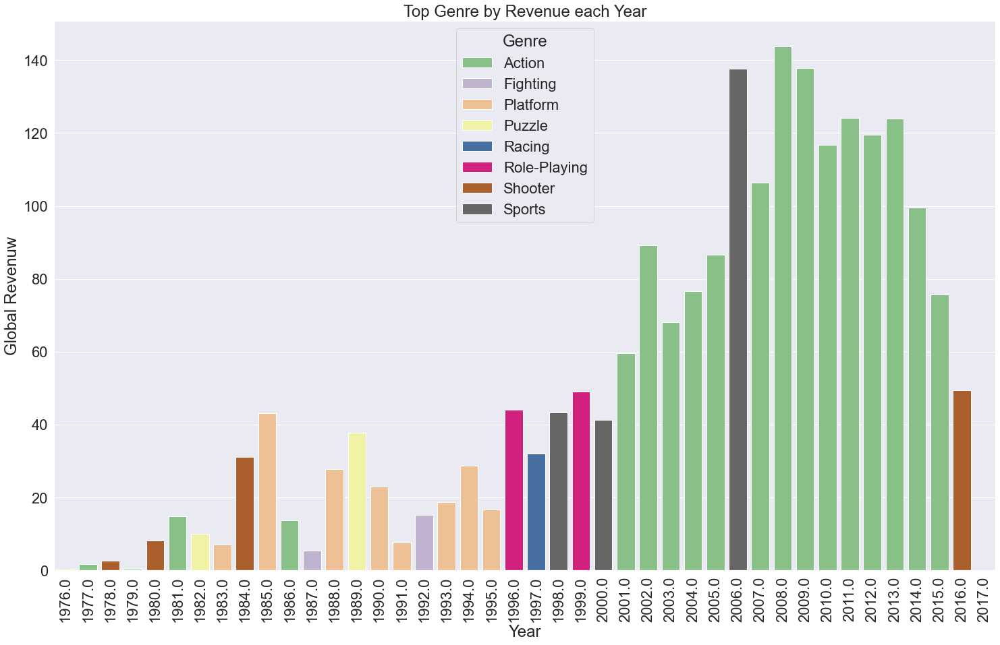

In [50]:
plt.figure(figsize=(25,15))
sns.barplot(x = "Year_of_Release", y = "Global_Sales", hue ="Genre", palette ="Accent", data=Highest_genre, dodge=False).set(title='Top Genre by Revenue each Year')
plt.xticks(rotation=90)
plt.xlabel("Year")
plt.ylabel("Global Revenuw")
sns.set(font_scale = 2)
plt.show()

**Findings**
  - We have some interesting insignts from the graph above.
  - From **1985 to 1995 "Platform"** stays as the top genre 3 times.
  - **"Acton"** dominates the market from **2001 to 2016.**
  - **2006, 2008 & 2009** has the highest sales made by a single genre.


  


------

Lifepsan of a console (Top Platform for every year along with the release date)

In [38]:
df_plat = df_modified[["Year_of_Release", "Platform", "Global_Sales"]]
sum_plat =df_plat.groupby(["Year_of_Release", "Platform"])["Global_Sales"].sum().reset_index()
sum_plat["Rank"] = sum_plat.groupby(["Year_of_Release"])["Global_Sales"].rank(ascending=False)
Highest_platform = sum_plat.loc[sum_plat["Rank"]==1]
Highest_platform.to_excel("Test_output.xlsx")

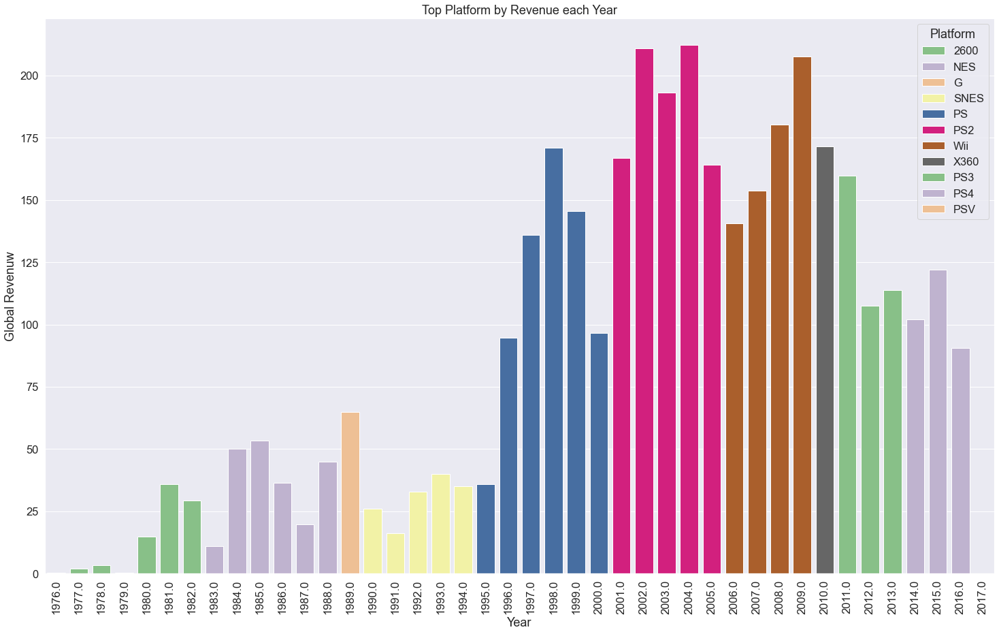

In [52]:
plt.figure(figsize=(25,15))
sns.barplot(x = "Year_of_Release", y = "Global_Sales", hue ="Platform", palette ="Accent", data=Highest_platform, dodge=False).set(title='Top Platform by Revenue each Year')
plt.xticks(rotation=90)
plt.xlabel("Year")
plt.ylabel("Global Revenuw")
sns.set(font_scale = 1.5)
plt.show()

**Findings**
  - On average a console stays on top for 3 - 5 years
  - Playstion release date December 3, 1994. Stayed on top from 1995 - 2000 even though there were new platforms released such as Nintendo 64 & Dreamcast.
  - PS2 released date March 4, 2000. Stayed on top from 2001 - 2005 even though Gamecube, Xbox & X360 were released during this timeframe.
  - PS2 is ranked number 1 in terms of overall sales & has the highest sales in the year 2002 & 2004.
    - Sony dominated the market for 10 consecutive years from 1955 - 2005 until Wii was released on 2006 even though PS3 was released on the same year.
  - Sony has again is the market leader in terms of revenue from 2011 - 2016.


  


---

Top publisher by Revenue each year

In [40]:
df_pub = df_modified[["Publisher", "Global_Sales", "Year_of_Release"]]
sum_pub = df_pub.groupby(["Year_of_Release", "Publisher"])["Global_Sales"].sum().reset_index()
sum_pub["Rank"] = sum_pub.groupby(["Year_of_Release"])["Global_Sales"].rank(ascending=False)
Highest_publisher = sum_pub.loc[sum_pub["Rank"]== 1]

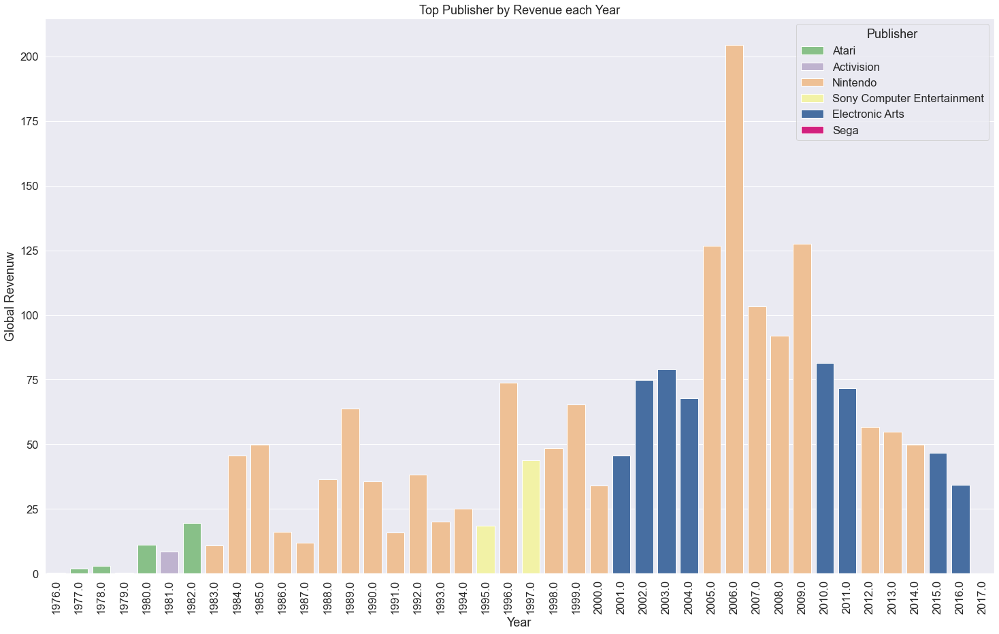

In [41]:
plt.figure(figsize=(25,15))
sns.barplot(x = "Year_of_Release", y = "Global_Sales", hue ="Publisher", palette ="Accent", data=Highest_publisher, dodge=False).set(title='Top Publisher by Revenue each Year')
plt.xticks(rotation=90)
plt.xlabel("Year")
plt.ylabel("Global Revenuw")
sns.set(font_scale = 2)
plt.show()

**Findings**
  - Nintendo has been the market leader for years. It has dominated the market from 1983 - 1994 continously.
  - Electronic Arts provided some competition for Nintendo & was on top from 2001 - 2004 however Nintendo back back on top from 2005- 2009. 
  


  


------

In [42]:
# Below section is a Work in progress

Following ScatterPlot Matrix shows relationships between top 100 Video Games according to Year, Platform, Genre  and Overall Sales.

In [43]:
df2 = df_modified.loc[:,["Year_of_Release","Platform","Genre", "Global_Sales" ]]

df2["index"] = np.arange(1,len(df_modified)+1)
# scatter matrix
fig = ff.create_scatterplotmatrix(df2, diag='box', index='index',colormap='YlOrRd',
                                  colormap_type='seq',
                                  height=1000, width=1200)
iplot(fig)

-----